#TFG - Proyecto CleanSea
 Realizado por: [Alejandro Sanchez Ferrer](mailto:alejandro_sanchez_ferrer@hotmail.com)
#Ingenieria Robótica

##**Importar librerias y Dataset almacenado en Google Drive**

En primer lugar vamos a importar las librerias necesarias y el Dataset que vamos a utilizar


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import json
import glob
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import StratifiedKFold
from sklearn import preprocessing
from PIL import Image
from google.colab import drive

In [ ]:
#Montamos nuestro contenido de gdrive para utilizar el dataset
#drive.mount("/content/gdrive")

!pip install --user gdown
!gdown https://drive.google.com/uc?id=1trJb06HyB2xUkPgcIfx8J6VReCtjqw66
!unzip -qq *.zip
!rm *.zip


Downloading...
From: https://drive.google.com/uc?id=1trJb06HyB2xUkPgcIfx8J6VReCtjqw66
To: /content/CleanSea_Dataset.zip
3.31GB [00:54, 47.0MB/s]


##**Definición del Dataset**

### Almacenamiento de Etiquetas y de Imagenes
Una vez hemos montado nuestro Google Drive e importando las librerias, procedemos a preparar los datos para la red. En primer lugar ordenaremos el dataset segun el label que posee cada imagen. Para ello leeremos acada archivo **JSON** y veremos que **"Label"** tiene dicha imagen. 

In [ ]:
#Configuracion del path para las imagenes
IMG_PATH = "/content/CleanSea_Dataset/DebrisImages/"

#Configuramos el path para los archivos .json
JSON_PATH = "/content/CleanSea_Dataset/SegmentationImages/"

#Realizamos una lectura de todos los json y extraemos el toppic 'labels' para almacenarla en una variable con todos los labels de todas las imagenes.
nlabels=[]
img_names= []

#Recorremos el folder donde se almacenan los .json
for file_name in [file for file in os.listdir(JSON_PATH)]:
  with open(JSON_PATH + file_name) as json_file:
    content= json.load(json_file)
    #Almacenamos con que imagen va relacionado
    jpegname= content['imagePath']
    #Almacenamos el numero de poligonos que se encuentran dentro de dicho .json
    nshapes= len(content['shapes'])
    #Recogemos los labels de cada uno de los poligonos anteriores
    for topic in range(nshapes):
      label=content['shapes'][topic]['label']
      #Añadimos cada label a la lista de labels (excepto las clases con los labels Metal_Chain y WashingMachine ya que no tienen las muestras minimas para poder separarlas) y el path de todas las imagenes
      if label != 'Metal_Chain' and label != 'WashingMachine':
        img_names.append( os.path.join(IMG_PATH, content['imagePath']))
        nlabels.append(label)

#Mostramos todos los labels e imagenes que hemos analizado
print('Stored Labels:', nlabels)
print('Images Names:', img_names)

labels=np.array(nlabels)
img_names=np.array(img_names)

Stored Labels: ['Plastic_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Pipe', 'Pipe', 'Pipe', 'Pipe', 'Pipe', 'Pipe', 'Fishing_Net', 'Fishing_Net', 'Towel', 'Pipe', 'Fishing_Net', 'Fishing_Net', 'Plastic_Bag', 'Glove', 'Plastic_Bag', 'Plastic_Debris', 'Plastic_Bag', 'Plastic_Bag', 'Plastic_Debris', 'Bottle', 'Towel', 'Can', 'Can', 'Can', 'Can', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Can', 'Basket', 'Plastic_Bag', 'Plastic_Bag', 'Glove', 'Packaging_Bag', 'Glove', 'Fishing_Net', 'Plastic_Bag', 'Can', 'Plastic_Bag', 'Fishing_Net', 'Fishing_Net', 'Can', 'Packaging_Bag', 'Towel', 'Plastic_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Can', 'Plastic_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Pipe', 'Bottle', 'Bottle', 'Basket', 'Packaging_Bag', 'Packaging_Bag', 'Pipe', 'Car_Bumper', 'Car_Bumper', 'Fishing_Net', 'Fishing_Net', 'Plastic_Bag', 'Packaging_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Towel', 'Towel', 'Plastic_Bag', '

#### Codificacion de Etiquetas
Una vez tenemos el label de cada imagen y almacenado en un array, con *ecdr.classes_* obtendremos todos los labels de todas las imagenes cargadas.

Para ello utilizaremos el metodo *LabelEnconder* de la libreria *sklearn.

In [ ]:
#Obtenemos todas las labels unicos existentes en nuestro dataset
labels, count = np.unique(nlabels, return_counts=True)
#Los mostramos
for idx, l in enumerate(labels):
  print(l, ':', count[idx])

Basket : 42
Bottle : 143
Can : 399
Car_Bumper : 68
Fishing_Net : 114
Glove : 46
Metal_Debris : 20
Packaging_Bag : 202
Pipe : 42
Plastic_Bag : 650
Plastic_Debris : 86
Rope : 79
Shoe : 8
Squared_Can : 20
Tire : 16
Towel : 54
Wood : 62


Transformamos los labels a una **codificacion normalizada(Numérica)**

In [ ]:
#Inicializamos el Encoder de labes
le = preprocessing.LabelEncoder()
#Introducimos los labels en el encoder
le.fit(nlabels)
#Aplicamos la codificacion a los labels introducidos y los almacenamos
Y = le.transform(nlabels)

#Mostramos los labels codificados
print(Y)
print(nlabels)

[ 9  9  9 ...  9  4 16]
['Plastic_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Pipe', 'Pipe', 'Pipe', 'Pipe', 'Pipe', 'Pipe', 'Fishing_Net', 'Fishing_Net', 'Towel', 'Pipe', 'Fishing_Net', 'Fishing_Net', 'Plastic_Bag', 'Glove', 'Plastic_Bag', 'Plastic_Debris', 'Plastic_Bag', 'Plastic_Bag', 'Plastic_Debris', 'Bottle', 'Towel', 'Can', 'Can', 'Can', 'Can', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Rope', 'Can', 'Basket', 'Plastic_Bag', 'Plastic_Bag', 'Glove', 'Packaging_Bag', 'Glove', 'Fishing_Net', 'Plastic_Bag', 'Can', 'Plastic_Bag', 'Fishing_Net', 'Fishing_Net', 'Can', 'Packaging_Bag', 'Towel', 'Plastic_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Can', 'Plastic_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Pipe', 'Bottle', 'Bottle', 'Basket', 'Packaging_Bag', 'Packaging_Bag', 'Pipe', 'Car_Bumper', 'Car_Bumper', 'Fishing_Net', 'Fishing_Net', 'Plastic_Bag', 'Packaging_Bag', 'Plastic_Bag', 'Plastic_Bag', 'Towel', 'Towel', 'Plasti

##**Separacion del Dataset: Train & Test**
Una vez tenemos tanto las imagenes como los labels podemos utilizar el metodo *[StratifiedKFold](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.StratifiedKFold.html)* para generar los conjuntos de datos de Test y Training que contengan la misma distribucion de labels o lo mas cercano posible


In [ ]:
#Realizamos una division de los datos en 1/5
skf = StratifiedKFold(n_splits=5)
train_index, test_index = next( skf.split(img_names, Y) )

#Almacenamos las imagenes segun donde van a ser movidas
X_train, X_test = img_names[train_index], img_names[test_index]
Y_train, Y_test = Y[train_index], Y[test_index]

#Mostramos las imagenes y la carpeta de destino
print("Images to be moved to Train Folder: \n", X_train)
print("\n Images to be moved to Test Folder: \n", X_test)

Images to be moved to Train Folder: 
 ['/content/CleanSea_Dataset/DebrisImages/3K0481ASC0113Hp04-05.jpg'
 '/content/CleanSea_Dataset/DebrisImages/6K1006OUT0017.jpg'
 '/content/CleanSea_Dataset/DebrisImages/HPD2029OUT0017.jpg' ...
 '/content/CleanSea_Dataset/DebrisImages/HPD0592HDTV0340.jpg'
 '/content/CleanSea_Dataset/DebrisImages/HPD1513HDTV0102.jpg'
 '/content/CleanSea_Dataset/DebrisImages/HPD1513HDTV0102.jpg']

 Images to be moved to Test Folder: 
 ['/content/CleanSea_Dataset/DebrisImages/6K0915OUT0027.jpg'
 '/content/CleanSea_Dataset/DebrisImages/6K0070OUT0017Hp01-17.jpg'
 '/content/CleanSea_Dataset/DebrisImages/HPD2044HDTV10229.jpg'
 '/content/CleanSea_Dataset/DebrisImages/6K0114OUT0008Hp01-08.jpg'
 '/content/CleanSea_Dataset/DebrisImages/6K0114OUT0008Hp01-08.jpg'
 '/content/CleanSea_Dataset/DebrisImages/6K0114OUT0008Hp01-08.jpg'
 '/content/CleanSea_Dataset/DebrisImages/6K0114OUT0008Hp01-08.jpg'
 '/content/CleanSea_Dataset/DebrisImages/6K0114OUT0008Hp01-08.jpg'
 '/content/CleanSea

### Train Dataset & Test Dataset
Una vez tenemos almacenadas las imagenes destinadas al conjunto de datos de train y cuales van destinadas al conjunto de datos de test, procedemos a crear dichos directorios y a mover cada imagen respectivamente.

In [ ]:
TRAIN_PATH = "/content/CleanSea_Dataset/train"
TEST_PATH = "/content/CleanSea_Dataset/test" 

#Creamos las carpetas para train y test
try:
    os.mkdir(TRAIN_PATH)
except OSError:
    print ("Creation of the directory %s failed" % TRAIN_PATH)
else:
    print ("Successfully created the directory %s " % TRAIN_PATH)

try:
    os.mkdir(TEST_PATH)
except OSError:
    print ("Creation of the directory %s failed" % TEST_PATH)
else:
    print ("Successfully created the directory %s " % TEST_PATH)


In [ ]:
import shutil
#Transformamos en listas ambas arrays para evitar imagenes duplicadas en las carpetas
X_train= list(dict.fromkeys(X_train))
X_test= list(dict.fromkeys(X_test))
print(X_train)
print(X_test)

#Copiamos las imagenes especificas a la carpeta train
for f in X_train:
  if os.path.isfile(f):
    #Recorremos el folder donde se almacenan los .json
    for file_name in [file for file in os.listdir(JSON_PATH)]:
      with open(JSON_PATH + file_name) as json_file:
        content= json.load(json_file)
        #Almacenamos con que imagen va relacionado
        jpegname= content['imagePath']
        full_jpegname= IMG_PATH + jpegname
        if full_jpegname == f:
          full_json_name= JSON_PATH + file_name
          print("Moving TRAIN JSON FILE...",full_json_name,"\n")
          shutil.copy(full_json_name,TRAIN_PATH)
    print("Moving TRAIN JPG FILE...",f,"\n")
    shutil.copy(f,TRAIN_PATH)


#Y a la carpeta test
for f in X_test:
  if (os.path.isfile(f)):
    #Recorremos el folder donde se almacenan los .json
    for file_name in [file for file in os.listdir(JSON_PATH)]:
      with open(JSON_PATH + file_name) as json_file:
        content= json.load(json_file)
        #Almacenamos con que imagen va relacionado
        jpegname= content['imagePath']
        full_jpegname= IMG_PATH + jpegname
        if full_jpegname == f:
          full_json_name= JSON_PATH + file_name
          print("Moving TEST JSON FILE...",full_json_name,"\n")
          shutil.copy(full_json_name,TEST_PATH)
    shutil.copy(f,TEST_PATH)
    print("Moving TEST JPG FILE...",f,"\n")

In [ ]:
#Y ahora movemos las carpetas a nuestro Drive
DATA_PATH = '/content/drive/MyDrive/CleanSea_Dataset'
shutil.move(TRAIN_PATH,DATA_PATH)
print("Movimiento de Train Completo")
shutil.move(TEST_PATH,DATA_PATH)
print("Movimiento de Test Completo")

##**MASK R-CNN para Instance Segmentation** 

En primer lugar nos copiamos el repositorio de MASK R-CNN  y descargamos el dataset en formato COCO.

Posteriormente importamos todas las librerias necesarias, y definimos las rutas tanto del repositorio como del dataset para poder acceder a el posteriormente.

Ya que hemos entrenado nuestra red de forma local, procedemos a descargar los pesos entrenados para poder evaluarlos a continuacion




### **Inicialización**

#### **Comprobacion de GPU disponibles para Entrenamiento y Deteccion**
Utilizamos este codigo para comprobar que tenemos espacio suficiente perteneciente a la GPU

In [1]:
# memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm() 

  Created wheel for gputil: filename=GPUtil-1.4.0-cp37-none-any.whl size=7411 sha256=d45489f061827b647936805818c839a6aeea6183cc74fd8bc71cafa3e395c21c
  Stored in directory: /root/.cache/pip/wheels/3d/77/07/80562de4bb0786e5ea186911a2c831fdd0018bda69beab71fd
Successfully built gputil
Gen RAM Free: 12.7 GB  | Proc size: 118.6 MB
GPU RAM Free: 15109MB | Used: 0MB | Util   0% | Total 15109MB


#### **Descarga de Datos y Librerias**

In [2]:
%cd /content/
!sudo rm -rf Mask_RCNN-tensorflow2.0/ test_coco_ok/ train_coco_ok/

#Descargamos el repositorio personalizado para el uso de TensorFlow 2.0
!gdown https://drive.google.com/uc?id=1O0uj7zibQSAHBdo2ItXZzi6cttBtb2OM
!unzip -qq *.zip
!rm *.zip

#Y obtenemos los train y test datasets en formato COCO
!gdown https://drive.google.com/uc?id=1ZdNWXU0mkoSK8JoEJ_LnNKH1SaVn8dnr
!unzip -qq *.zip
!rm *.zip

#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/logs/
!gdown https://drive.google.com/uc?id=184CsO-SEOBcycZBRXnYbUAsCtfDA1e_K
!pip install -r /content/Mask_RCNN-tensorflow2.0/requirements.txt
!pip install tensorflow==2.4.0
!pip install imgaug

/content
Downloading...
From: https://drive.google.com/uc?id=1O0uj7zibQSAHBdo2ItXZzi6cttBtb2OM
To: /content/Mask_RCNN-tensorflow2.0.zip
313MB [00:05, 55.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ZdNWXU0mkoSK8JoEJ_LnNKH1SaVn8dnr
To: /content/coco.zip
864MB [00:08, 101MB/s] 
/content/Mask_RCNN-tensorflow2.0/logs
Downloading...
From: https://drive.google.com/uc?id=184CsO-SEOBcycZBRXnYbUAsCtfDA1e_K
To: /content/Mask_RCNN-tensorflow2.0/logs/mask_rcnn_coco.h5
258MB [00:06, 37.7MB/s]
     |████████████████████████████████| 163kB 27.6MB/s 
     |████████████████████████████████| 204kB 41.6MB/s 
     |████████████████████████████████| 394.7MB 43kB/s 
     |████████████████████████████████| 2.9MB 92kB/s 
     |████████████████████████████████| 471kB 53.7MB/s 
     |████████████████████████████████| 3.8MB 35.0MB/s 
  Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
  Found existing installation: gast 0.4.0
    Uninsta

#### **Definicion de Rutas y Librerias**

In [3]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
import json
from PIL import Image, ImageDraw
from tensorflow.python.framework.versions import VERSION as __version__
import tensorflow as tf
import imgaug

import warnings
warnings.filterwarnings(action='ignore')

#Cambiamos el Directorio al propio de MASK_RCNN
ROOT_DIR = '/content/Mask_RCNN-tensorflow2.0'
assert os.path.exists(ROOT_DIR), 'ROOT_DIR does not exist'

# Import mrcnn libraries
sys.path.append(ROOT_DIR)
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

# Directorio perteneciente a MASK-RCNN
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Ruta al archivo de pesos
COCO_WEIGHTS_PATH = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights.h5")

# Descargamos los Pesos Entrenados de COCO
if not os.path.exists(COCO_WEIGHTS_PATH):
    utils.download_trained_weights(COCO_WEIGHTS_PATH)

... done downloading pretrained model!


#### **Configuracion del Entrenamiento**

In [4]:
############################################################
#  Configuracion
############################################################

class CleanSeaConfig(Config):
    """
    Configuracion para el entrenamiento con CleanSea Dataset.
    """

    # Nombre de la configuracion
    NAME = "debris"

    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 1

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512

    # Numero de clases + el background
    NUM_CLASSES = 1 + 19  # Cleansea tiene 19 clases

    # Numero de pasos por epoca en el entrenamiento
    #STEPS_PER_EPOCH = 100
    
    # Salta las detecciones con <90% de seguridad
    DETECTION_MIN_CONFIDENCE = 0.5

    LEARNING_RATE = 0.001
    

config= CleanSeaConfig()
config.display()

def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.

    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.5
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                32
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE             

#### **Configuracion del Dataset**

Se realiza una carga de todas las imagenes y anotaciones necesarias para aplicar las mascaras durante la deteccion

In [5]:
############################################################
#  Dataset
############################################################

class CleanSeaDataset(utils.Dataset):
    def load_data(self, dataset_dir, subset):
        # Train or validation dataset?
        assert subset in ["train_coco_ok", "test_coco_ok"]
        dataset_dir = os.path.join(dataset_dir, subset)
        print(dataset_dir)

        # Cargamos el archivo json
        annotation_json = os.path.join(dataset_dir,"annotations.json")
        json_file = open(annotation_json)
        coco_json = json.load(json_file)
        json_file.close()
        print("\nAnotaciones Cargadas\n")

        # Añadimos los nombres de las clases usando el metodo de utils.Dataset
        source_name = "coco_like"
        for category in coco_json['categories']:
            class_id = category['id']
            class_name = category['name']
            if class_id < 1:
                print('Error: Class id for "{}" reserved for the background'.format(class_name))
            else:
                self.add_class(source_name, class_id, class_name)
        print("Nombres Añadidos \n")

        # Almacenamos las anotaciones
        annotations = {}
        for annotation in coco_json['annotations']:
            image_id = annotation['image_id']
            if image_id not in annotations:
                annotations[image_id] = []
            annotations[image_id].append(annotation)
        print("Anotaciones Almacenadas\n")

        # Almacenamos las imagenes y las añadimos al dataset
        seen_images = {}
        for image in coco_json['images']:
            image_id = image['id']
            if image_id in seen_images:
                print("Warning: Skipping duplicate image id: {}".format(image))
            else:
                seen_images[image_id] = image
                try:
                    image_file_name = image['file_name']
                    image_width = image['width']
                    image_height = image['height']
                except KeyError as key:
                    print("Warning: Skipping image (id: {}) with missing key: {}".format(image_id, key))
                
                image_path = os.path.join(dataset_dir, image_file_name)
                image_annotations = annotations[image_id]
                
                # Añadimos la imagen usando el metodo de utils.Dataset
                self.add_image(
                    source=source_name,
                    image_id=image_id,
                    path=image_path,
                    width=image_width,
                    height=image_height,
                    annotations=image_annotations
                )
        print("Imagenes añadidas al Dataset\n")

    def load_mask(self, image_id):
        """ Carga la mascara de instancia para la imagen dada
        MaskRCNN espera mascaras en forma de mapa de bits (altura, anchura e instancias)
        Argumentos:
            image_id: El ID de la imagen a la que vamos a cargar la mascara
        Salida:
            masks: Una cadena booleana con estructura (altura, anchya y la cuenta de instancias) con una mascara por instancia
            class_ids: Una cadena de 1 dimension de clase ID de la instancia de la mascara """
        image_info = self.image_info[image_id]
        annotations = image_info['annotations']
        instance_masks = []
        class_ids = []
        
        for annotation in annotations:
            class_id = annotation['category_id']
            mask = Image.new('1', (image_info['width'], image_info['height']))
            mask_draw = ImageDraw.ImageDraw(mask, '1')
            for segmentation in annotation['segmentation']:
                mask_draw.polygon(segmentation, fill=1)
                bool_array = np.array(mask) > 0
                instance_masks.append(bool_array)
                class_ids.append(class_id)

        mask = np.dstack(instance_masks)
        class_ids = np.array(class_ids, dtype=np.int32)
        return mask, class_ids

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "object":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


Inicializamos los datasets para el entrenamiento y la validacion

#### **Inicializacion y Configuracion de los Conjuntos de Entrenamiento y Validacion**

In [6]:
"""Train the model."""
# Training dataset.
dataset_train = CleanSeaDataset()
print("Configuracion para train cargada\n")
dataset_train.load_data("/content","train_coco_ok")
print("Dataset Inicializado Correctamente\n")
dataset_train.prepare()
print("Preparacion del Dataset Completada\n")

# Validation dataset
dataset_test = CleanSeaDataset()
print("Configuracion para test cargada\n")
dataset_test.load_data("/content", "test_coco_ok")
print("Dataset Inicializado Correctamente\n")
dataset_test.prepare()
print("Preparacion del Dataset Completada\n")

Configuracion para train cargada

/content/train_coco_ok

Anotaciones Cargadas

Error: Class id for "background" reserved for the background
Nombres Añadidos 

Anotaciones Almacenadas

Imagenes añadidas al Dataset

Dataset Inicializado Correctamente

Preparacion del Dataset Completada

Configuracion para test cargada

/content/test_coco_ok

Anotaciones Cargadas

Error: Class id for "background" reserved for the background
Nombres Añadidos 

Anotaciones Almacenadas

Imagenes añadidas al Dataset

Dataset Inicializado Correctamente

Preparacion del Dataset Completada



##### **Ejemplos de la aplicacion de las mascaras sobre las imagenes**

Mostrando Imagenes aleatorias...



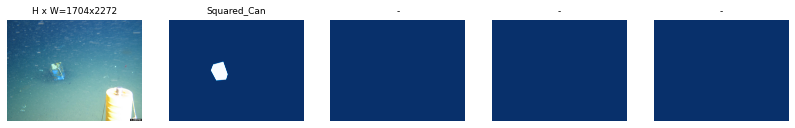

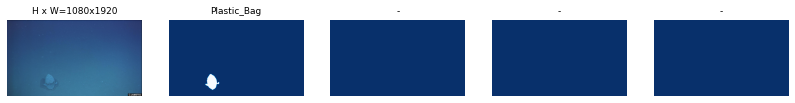

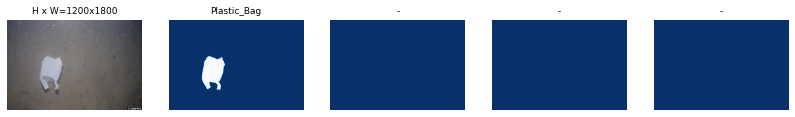

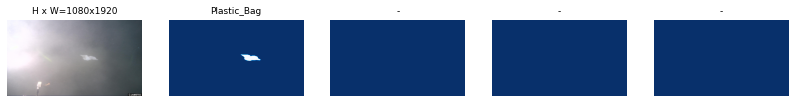

In [ ]:
print("Mostrando Imagenes aleatorias...\n")

image_ids = np.random.choice(dataset_train.image_ids, 4)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)

#### **Inicializacion del modelo para entrenamiento**
Una vez hemos comprobado que se aplican bien las máscaras, podemos comenzar a entrenar la red. Para ello inicializaremos el modelo para entrenamiento y seleccionaremos los pesos con los que queremos entrenar la red.

Como no tenemos pesos entrenados inicialmente, utilizaremos los pesos predeterminados de coco

In [ ]:
print("Inicializando modelo para entrenamiento...\n")
model=modellib.MaskRCNN(mode="training", config=config, model_dir=MODEL_DIR)
# Which weights to start with?
init_with = "coco"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_WEIGHTS_PATH, by_name=True,
                    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last(), by_name=True)

Inicializando modelo para entrenamiento...



### **Entrenamiento del modelo**

In [ ]:
############################################################
#  Entrenamiento
############################################################
# ===============================================================================
# Aumentado de Datos
# ===============================================================================
from imgaug import augmenters as iaa
SAVE_PATH = '/content/drive/MyDrive/Project_CleanSea/Logs'
seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(
        0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    # Strengthen or weaken the contrast in each image.
    iaa.LinearContrast((0.75, 1.5)),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-8, 8)
    )
], random_order=True) # apply augmenters in random order

# ===============================================================================

# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.

print("Entrenando Heads...\n")
model.train(dataset_train, dataset_test, learning_rate=config.LEARNING_RATE, epochs=2, layers='heads',augmentation=seq)

# Fine tune all layers
# Passing layers="all" trains all layers. You can also 
# pass a regular expression to select which layers to
# train by name pattern.

# Añadimos aumentado de imagenes
# Giramos las imagenes el 50% de las veces
#aumentado = imgaug.augmenters.Fliplr(0.5)
#augmentation = aumentado
print("Entrenando extensivamente...\n")
model.train(dataset_train, dataset_test, 
            learning_rate=config.LEARNING_RATE / 10,
            epochs=10, 
            layers="all",augmentation=seq)

# Save weights
# Typically not needed because callbacks save after every epoch
# Uncomment to save manually
print("Guardando Pesos...\n")
model_path = os.path.join(MODEL_DIR, "mask_rcnn_debris_weights.h5")
model.keras_model.save_weights(model_path)
print("Pesos Guardados en mask_rcnn_debris_weights.h2")
#!tensorboard dev upload --logdir /content/Mask_RCNN-tensorflow2.0/logs
shutil.move(model_path,SAVE_PATH)
print("Logs Almacenados en Drive")

Entrenando Heads...


Starting at epoch 0. LR=0.001

Checkpoint Path: /content/Mask_RCNN-tensorflow2.0/logs/debris20210418T2029/mask_rcnn_debris_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (TimeDi

### **Validacion del modelo**

#### **Evaluacion con Pesos entrenados (25 Epocas)** 

/content/Mask_RCNN-tensorflow2.0
Downloading...
From: https://drive.google.com/uc?id=1iY-jFwRv1LHL7ItqQ9HfZ_R4dONMXYx8
To: /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights2505.h5
257MB [00:04, 58.6MB/s]
Loading weights from  /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights2505.h5
original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 2560.00000  float64
gt_class_id              shape: (3,)                  min:    1.00000  max:    4.00000  int32
gt_bbox                  shape: (3, 4)                min:   53.00000  max:  315.00000  int32
gt_mask                  shape: (512, 512, 3)         min:    0.00000  max:    1.00000  bool


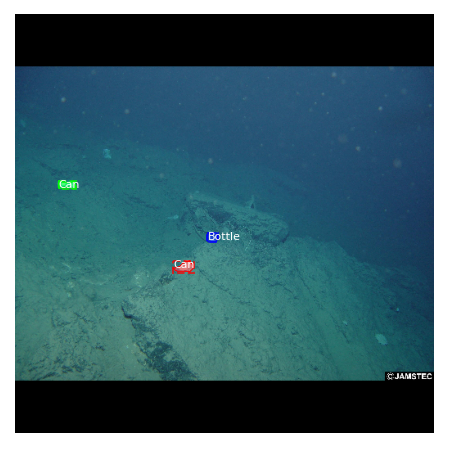

In [ ]:
############################################################
#  Evaluacion
############################################################
#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/
!gdown https://drive.google.com/uc?id=1iY-jFwRv1LHL7ItqQ9HfZ_R4dONMXYx8
class InferenceConfig(CleanSeaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights2505.h5")
#model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


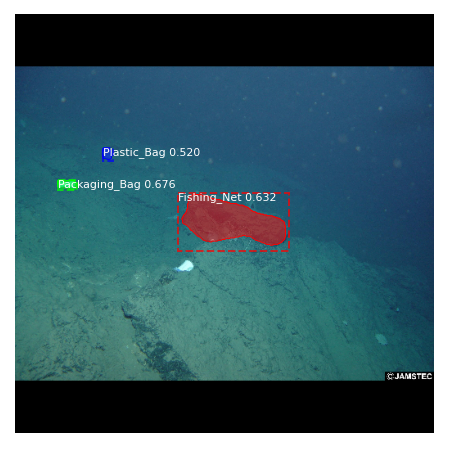

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 1920.00000  float64
gt_class_id              shape: (3,)                  min:   12.00000  max:   12.00000  int32
gt_bbox                  shape: (3, 4)                min:  163.00000  max:  376.00000  int32
gt_mask                  shape: (512, 512, 3)         min:    0.00000  max:    1.00000  bool


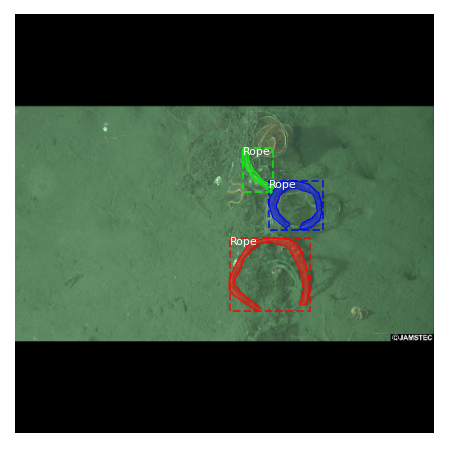

In [ ]:
# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  150.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


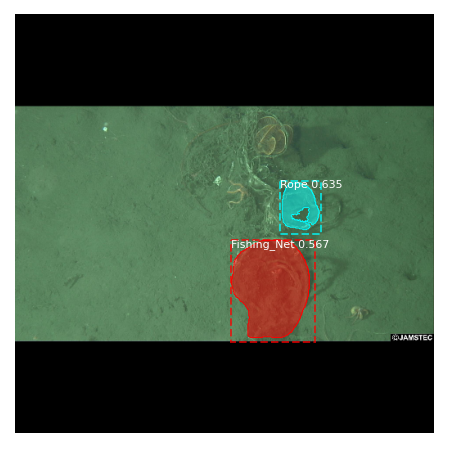

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    
    APs.append(AP)

print("mAP: ", np.mean(APs))

mAP:  0.4720577391812638


#### **Evaluacion con Pesos entrenados (50 Epocas)** 

/content/Mask_RCNN-tensorflow2.0
Downloading...
From: https://drive.google.com/uc?id=1iIBS1_jHmtSa5gKghDIgIvuCN5GgvtUF
To: /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights50.h5
257MB [00:04, 54.4MB/s]
Loading weights from  /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights50.h5
original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 1920.00000  float64
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  173.00000  max:  424.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  bool


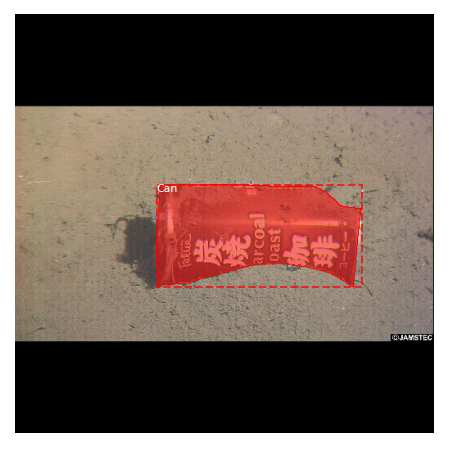

In [ ]:
############################################################
#  Evaluacion
############################################################
#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/
!gdown https://drive.google.com/uc?id=1iIBS1_jHmtSa5gKghDIgIvuCN5GgvtUF
class InferenceConfig(CleanSeaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights50.h5")
#model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


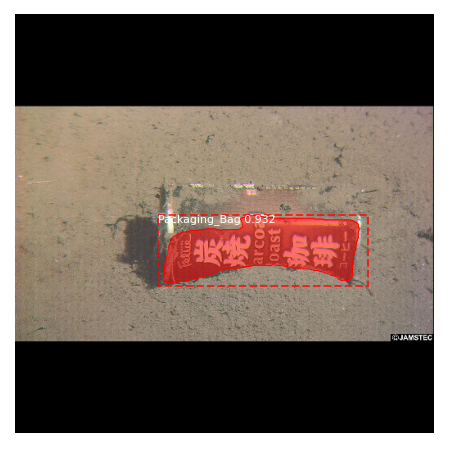

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 1920.00000  float64
gt_class_id              shape: (4,)                  min:    1.00000  max:   15.00000  int32
gt_bbox                  shape: (4, 4)                min:   39.00000  max:  359.00000  int32
gt_mask                  shape: (512, 512, 4)         min:    0.00000  max:    1.00000  bool


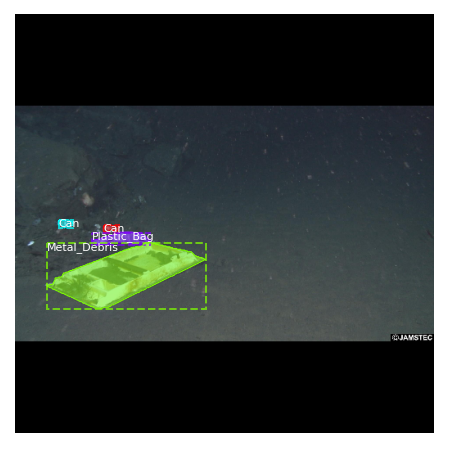

In [ ]:
# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32

*** No instances to display *** 



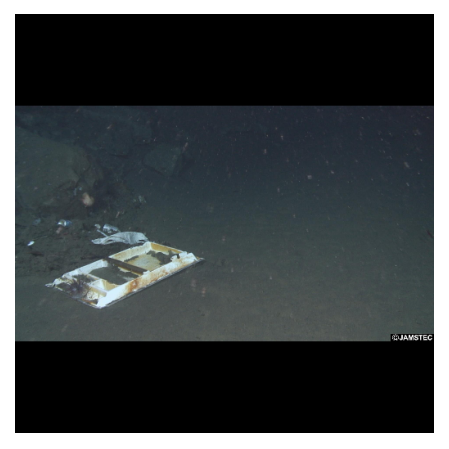

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    
    APs.append(AP)

print("mAP: ", np.mean(APs))

mAP:  0.4975111971287813


#### **Evaluacion con Pesos entrenados (75 Epocas)** 



/content/Mask_RCNN-tensorflow2.0
Downloading...
From: https://drive.google.com/uc?id=141SZd-LzJJs0Mwq7W7PNyPz-BC4pqWab
To: /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights7505.h5
257MB [00:01, 173MB/s]
Loading weights from  /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights7505.h5
original_image           shape: (512, 512, 3)         min:    0.00000  max:  254.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 1920.00000  float64
gt_class_id              shape: (1,)                  min:    8.00000  max:    8.00000  int32
gt_bbox                  shape: (1, 4)                min:   46.00000  max:  466.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  bool


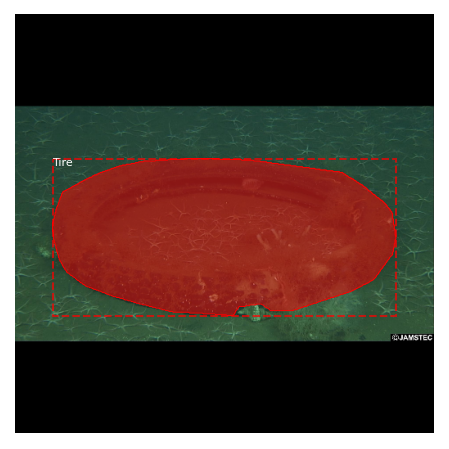

In [ ]:
############################################################
#  Evaluacion
############################################################
#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/
!gdown https://drive.google.com/uc?id=141SZd-LzJJs0Mwq7W7PNyPz-BC4pqWab
class InferenceConfig(CleanSeaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights7505.h5")
#model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  149.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


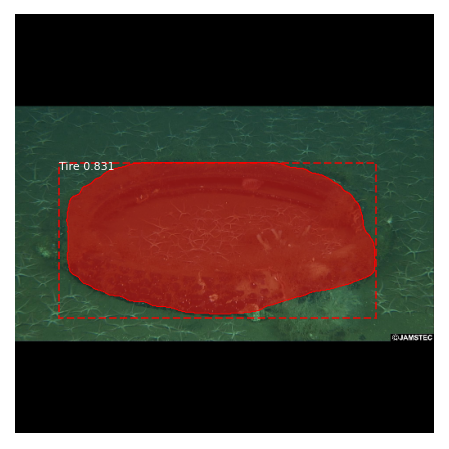

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 4608.00000  float64
gt_class_id              shape: (1,)                  min:   18.00000  max:   18.00000  int32
gt_bbox                  shape: (1, 4)                min:   41.00000  max:  421.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  bool


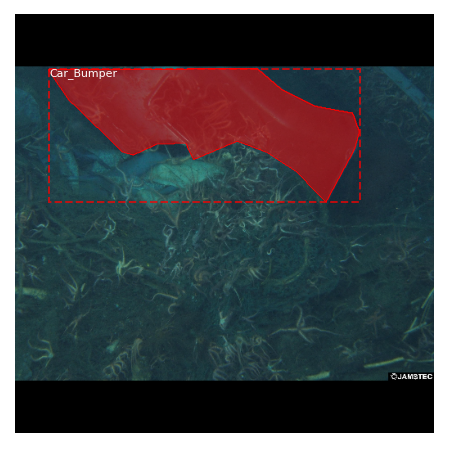

In [ ]:
# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


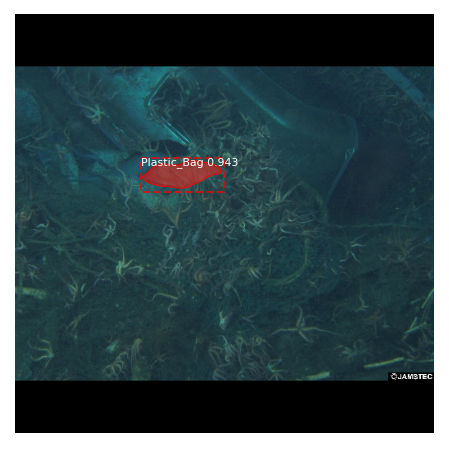

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))


mAP:  0.4992679590428521


#### **Evaluacion con Pesos entrenados (100 Epocas)** 


/content/Mask_RCNN-tensorflow2.0
Downloading...
From: https://drive.google.com/uc?id=1AfpFadG5-xYgkyfwNwDT4XCtRvhHPWAt
To: /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights10005.h5
257MB [00:01, 187MB/s]
Instructions for updating:
Use fn_output_signature instead
Loading weights from  /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights10005.h5
original_image           shape: (512, 512, 3)         min:    0.00000  max:  254.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 1920.00000  float64
gt_class_id              shape: (1,)                  min:    5.00000  max:    5.00000  int32
gt_bbox                  shape: (1, 4)                min:   48.00000  max:  345.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  bool


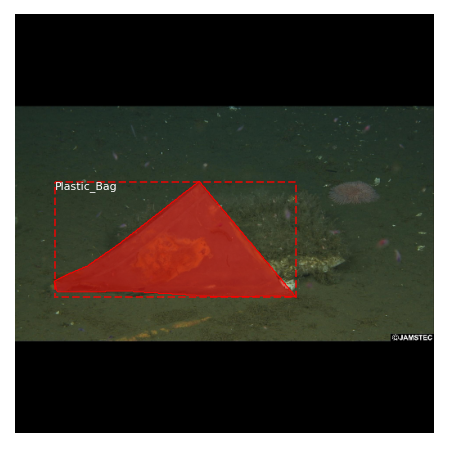

In [ ]:
############################################################
#  Evaluacion
############################################################
#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/
!gdown https://drive.google.com/uc?id=1AfpFadG5-xYgkyfwNwDT4XCtRvhHPWAt

class InferenceConfig(CleanSeaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights10005.h5")
#model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  150.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


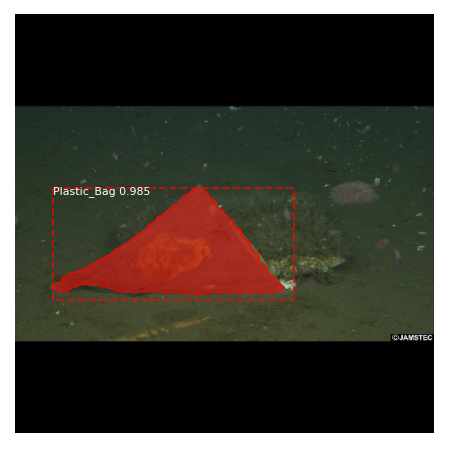

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 4608.00000  float64
gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  233.00000  max:  267.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  bool


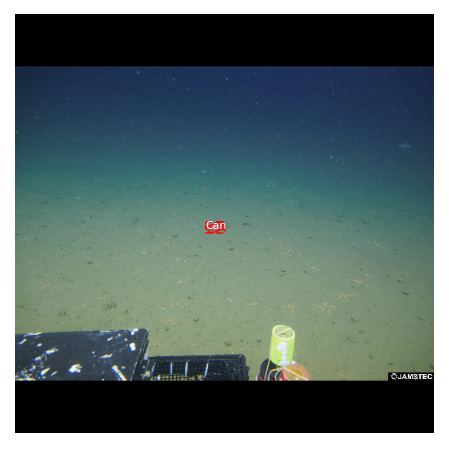

In [ ]:
# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32

*** No instances to display *** 



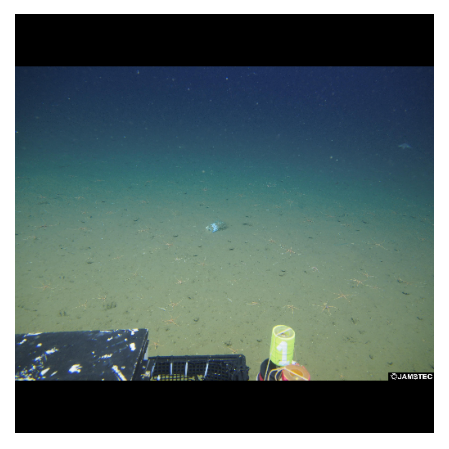

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.520347318658412


#### **Evaluacion con Pesos entrenados (200 Epocas)** 


/content/Mask_RCNN-tensorflow2.0
Downloading...
From: https://drive.google.com/uc?id=1WPRhFbBMZKVQMidUSoSRjv0QCaaw-Dab
To: /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights20005.h5
257MB [00:05, 49.5MB/s]
Loading weights from  /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights20005.h5
original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 1800.00000  float64
gt_class_id              shape: (1,)                  min:    3.00000  max:    3.00000  int32
gt_bbox                  shape: (1, 4)                min:  146.00000  max:  359.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  bool


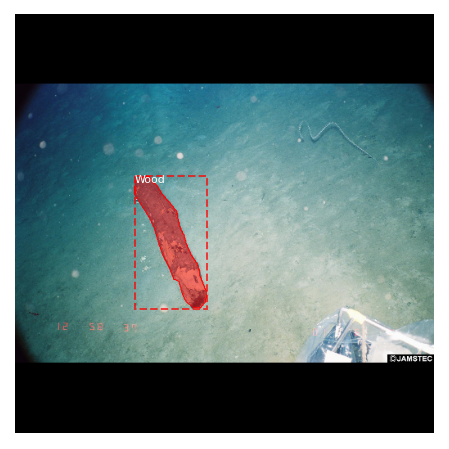

In [ ]:
############################################################
#  Evaluacion
############################################################
#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/
!gdown https://drive.google.com/uc?id=1WPRhFbBMZKVQMidUSoSRjv0QCaaw-Dab

class InferenceConfig(CleanSeaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights20005.h5")
#model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


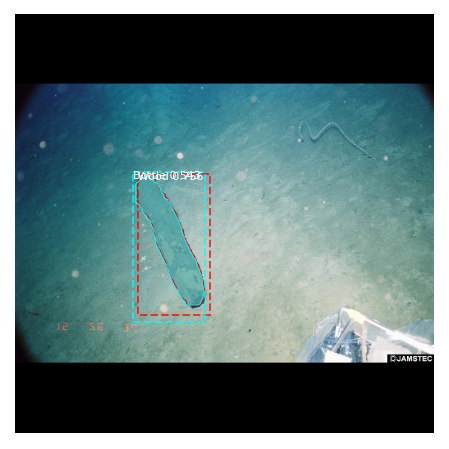

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 1920.00000  float64
gt_class_id              shape: (1,)                  min:   14.00000  max:   14.00000  int32
gt_bbox                  shape: (1, 4)                min:  249.00000  max:  366.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  bool


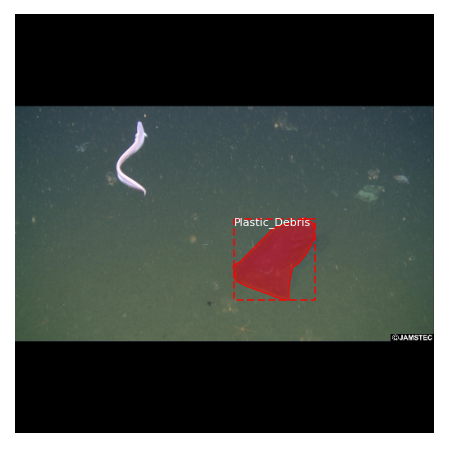

In [ ]:
# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


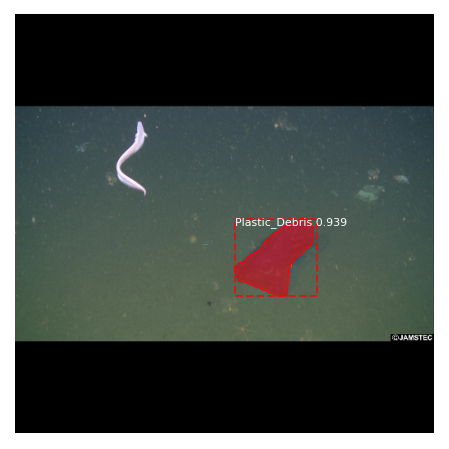

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.5520523917638311


#### **Evaluacion con Pesos entrenados y ligero aumentado de Datos(200 Epocas)** 


/content/Mask_RCNN-tensorflow2.0
Downloading...
From: https://drive.google.com/uc?id=19ttEo7EYka9aSUA-zop_lXoSrqpT1kBH
To: /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights200DA.h5
257MB [00:00, 280MB/s]
Loading weights from  /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights200DA.h5
original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 1800.00000  float64
gt_class_id              shape: (1,)                  min:    5.00000  max:    5.00000  int32
gt_bbox                  shape: (1, 4)                min:  193.00000  max:  339.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  bool


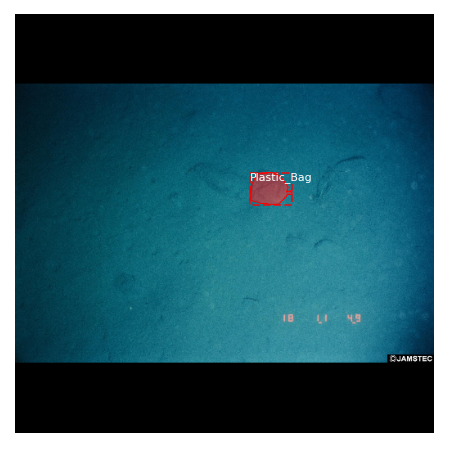

In [ ]:
############################################################
#  Evaluacion
############################################################
#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/
!gdown https://drive.google.com/uc?id=19ttEo7EYka9aSUA-zop_lXoSrqpT1kBH
class InferenceConfig(CleanSeaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights200DA.h5")
#model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


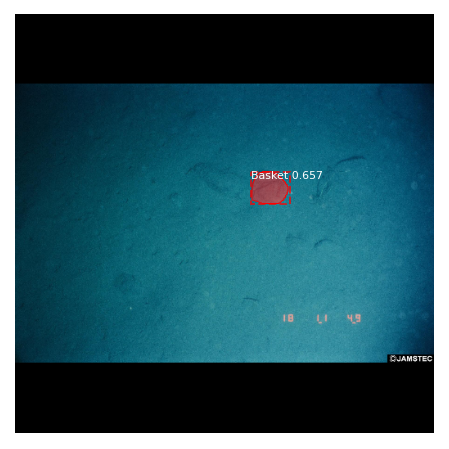

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 2160.00000  float64
gt_class_id              shape: (9,)                  min:    5.00000  max:    9.00000  int32
gt_bbox                  shape: (9, 4)                min:    1.00000  max:  510.00000  int32
gt_mask                  shape: (512, 512, 9)         min:    0.00000  max:    1.00000  bool


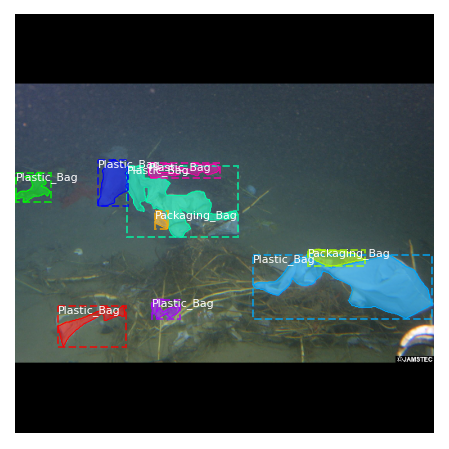

In [ ]:
# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


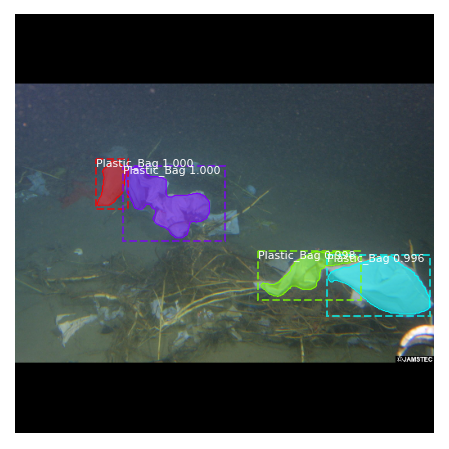

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.5358116845878194


#### **Evaluacion con Pesos entrenados y ligero aumentado de Datos(500 Epocas)** 

/content/Mask_RCNN-tensorflow2.0
Downloading...
From: https://drive.google.com/uc?id=1HAJaN3SI4O-QozSY8ugo5VeaIaYTyh-6
To: /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights500DA.h5
257MB [00:03, 71.0MB/s]
Loading weights from  /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights500DA.h5
original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 1920.00000  float64
gt_class_id              shape: (1,)                  min:    9.00000  max:    9.00000  int32
gt_bbox                  shape: (1, 4)                min:  230.00000  max:  367.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  bool


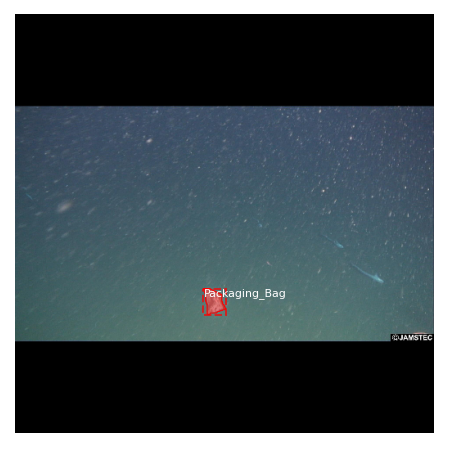

In [ ]:
############################################################
#  Evaluacion
############################################################
#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/
!gdown https://drive.google.com/uc?id=1HAJaN3SI4O-QozSY8ugo5VeaIaYTyh-6
class InferenceConfig(CleanSeaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights500DA.h5")
#model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


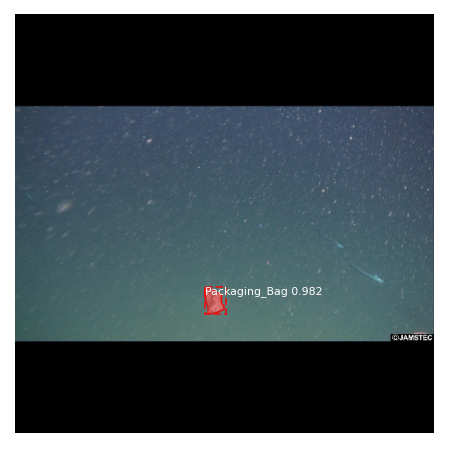

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 4608.00000  float64
gt_class_id              shape: (3,)                  min:    1.00000  max:    5.00000  int32
gt_bbox                  shape: (3, 4)                min:  185.00000  max:  511.00000  int32
gt_mask                  shape: (512, 512, 3)         min:    0.00000  max:    1.00000  bool


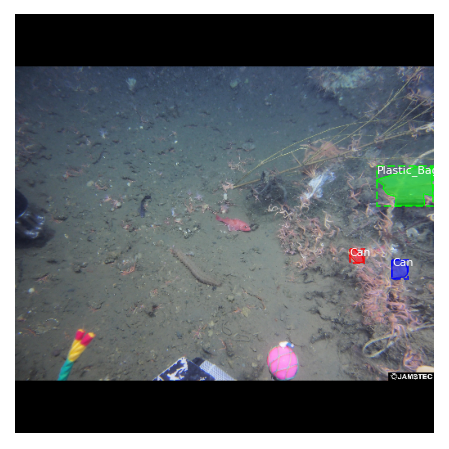

In [ ]:
# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


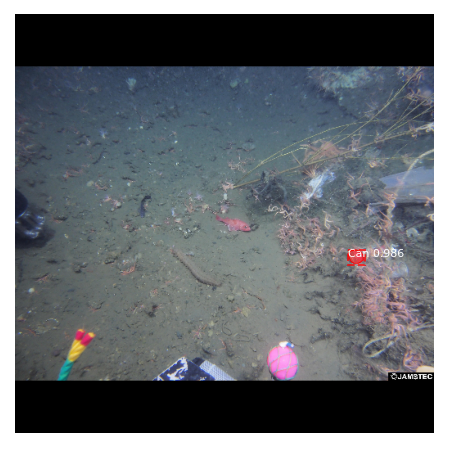

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.5538630655531861


#### **Evaluacion con Pesos entrenados y aumentado de Datos Severo (200 Epocas)** 


/content/Mask_RCNN-tensorflow2.0
Downloading...
From: https://drive.google.com/uc?id=1CTyoTKnXGcncAHfkotLas_vc0IRqMfZ2
To: /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights200DA+.h5
257MB [00:02, 118MB/s]
Loading weights from  /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights200DA+.h5
original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 2272.00000  float64
gt_class_id              shape: (1,)                  min:   12.00000  max:   12.00000  int32
gt_bbox                  shape: (1, 4)                min:  164.00000  max:  325.00000  int32
gt_mask                  shape: (512, 512, 1)         min:    0.00000  max:    1.00000  bool


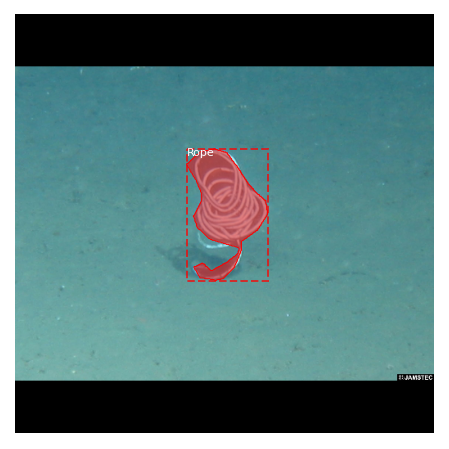

In [ ]:
############################################################
#  Evaluacion
############################################################
#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/
!gdown https://drive.google.com/uc?id=1CTyoTKnXGcncAHfkotLas_vc0IRqMfZ2

class InferenceConfig(CleanSeaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights200DA+.h5")
#model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32

*** No instances to display *** 



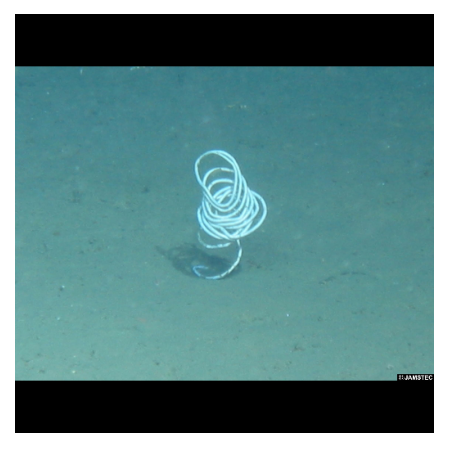

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 4608.00000  float64
gt_class_id              shape: (8,)                  min:    5.00000  max:   18.00000  int32
gt_bbox                  shape: (8, 4)                min:    1.00000  max:  440.00000  int32
gt_mask                  shape: (512, 512, 8)         min:    0.00000  max:    1.00000  bool


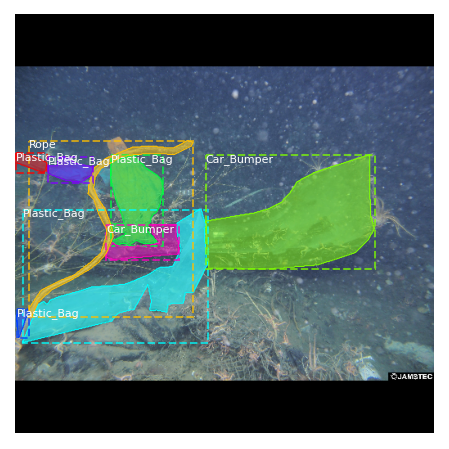

In [ ]:
# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


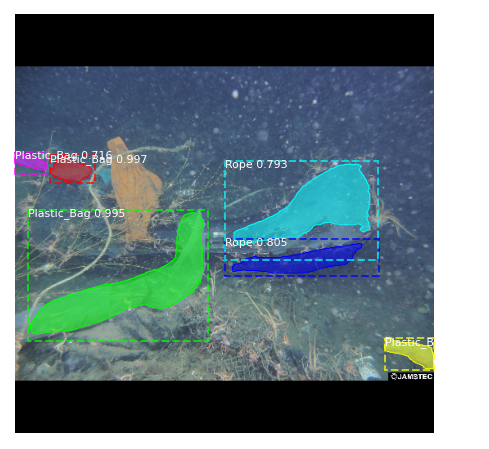

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.5866550965352965


#### **Evaluacion con Pesos entrenados y aumentado de Datos severo (500 Epocas)** 

/content/Mask_RCNN-tensorflow2.0
Downloading...
From: https://drive.google.com/uc?id=1SD-_6dSivqL5eEuvNRmAIzBVUtYeglP0
To: /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights428DA5Heads.h5
257MB [00:03, 100MB/s]
Loading weights from  /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights428DA5Heads.h5
original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 4608.00000  float64
gt_class_id              shape: (2,)                  min:   18.00000  max:   18.00000  int32
gt_bbox                  shape: (2, 4)                min:  229.00000  max:  484.00000  int32
gt_mask                  shape: (512, 512, 2)         min:    0.00000  max:    1.00000  bool


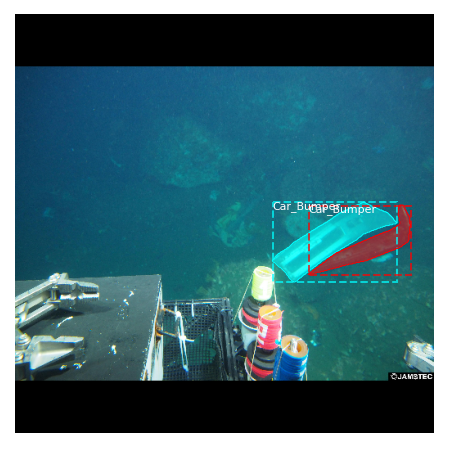

In [ ]:
############################################################
#  Evaluacion
############################################################
#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/
!gdown https://drive.google.com/uc?id=1SD-_6dSivqL5eEuvNRmAIzBVUtYeglP0
class InferenceConfig(CleanSeaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights428DA5Heads.h5")
#model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


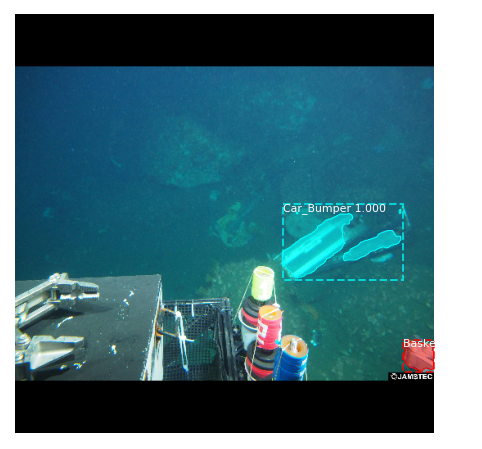

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 4608.00000  float64
gt_class_id              shape: (13,)                 min:    1.00000  max:   14.00000  int32
gt_bbox                  shape: (13, 4)               min:    1.00000  max:  435.00000  int32
gt_mask                  shape: (512, 512, 13)        min:    0.00000  max:    1.00000  bool


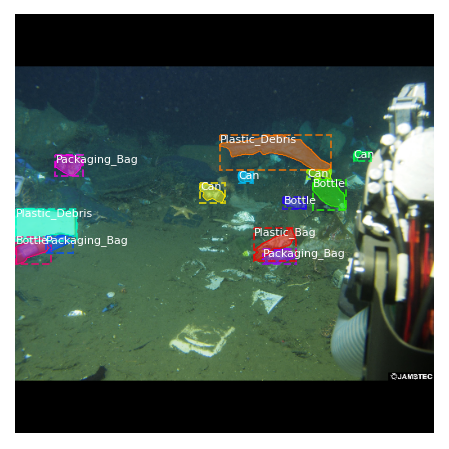

In [ ]:
# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


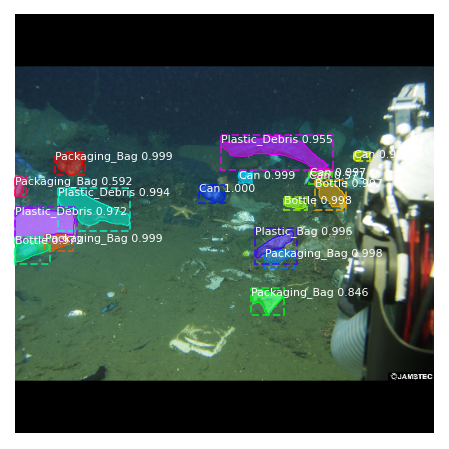

In [ ]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.5753542260458772


# Inspección del modelo con mejores resultados

## **Evaluacion con Pesos entrenados y aumentado de Datos severo (1000 Epocas)** 

In [7]:
############################################################
#  Evaluacion
############################################################
#Descargamos los pesos entrenados de forma local
%cd /content/Mask_RCNN-tensorflow2.0/
!gdown https://drive.google.com/uc?id=1GmJ6zouasMsHw7t90IB_XHvz3wUuhrxZ
class InferenceConfig(CleanSeaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "mask_rcnn_debris_weights1000DA5Heads.h5")
#model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)


/content/Mask_RCNN-tensorflow2.0
Downloading...
From: https://drive.google.com/uc?id=1GmJ6zouasMsHw7t90IB_XHvz3wUuhrxZ
To: /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights1000DA5Heads.h5
257MB [00:02, 98.8MB/s]
Instructions for updating:
Use fn_output_signature instead
Loading weights from  /content/Mask_RCNN-tensorflow2.0/mask_rcnn_debris_weights1000DA5Heads.h5


### Detección Deseada vs Obtenida

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
image_meta               shape: (32,)                 min:    0.00000  max: 1920.00000  float64
gt_class_id              shape: (16,)                 min:    1.00000  max:    9.00000  int32
gt_bbox                  shape: (16, 4)               min:  113.00000  max:  460.00000  int32
gt_mask                  shape: (512, 512, 16)        min:    0.00000  max:    1.00000  bool


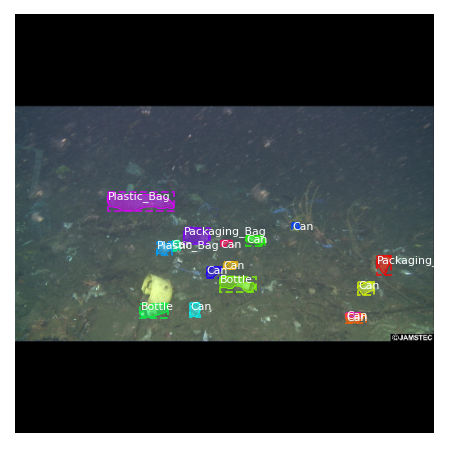

In [76]:
# Test on a random image
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config, 
                           image_id)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_test.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32


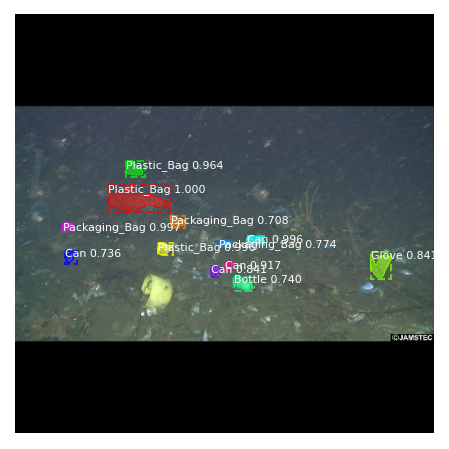

In [77]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())

### Recuperación de precisión

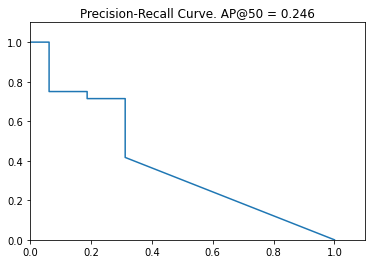

In [78]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
visualize.plot_precision_recall(AP, precisions, recalls)

### Matriz de Confusión

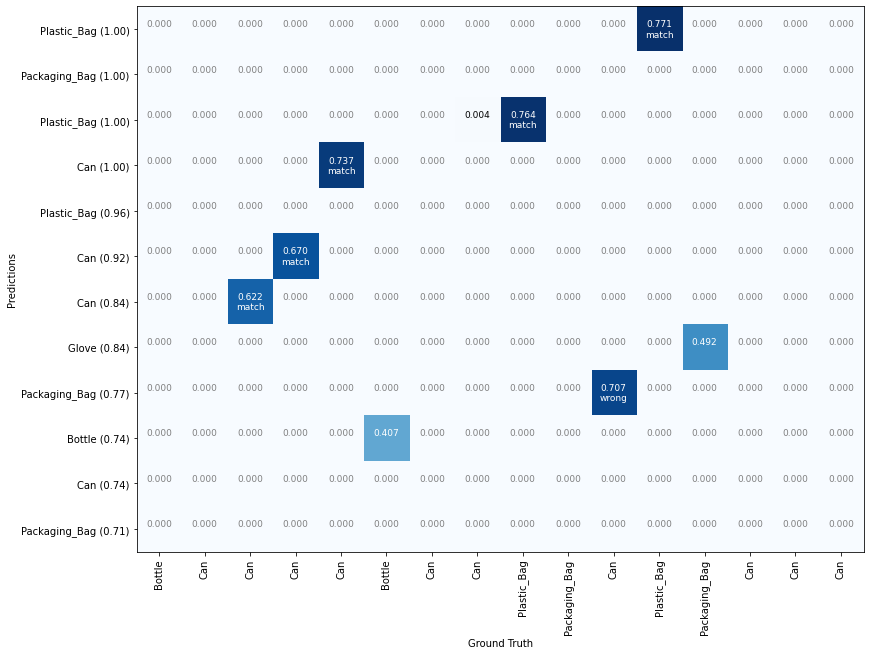

In [79]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset_test.class_names)

### Precisión del Modelo entrenado

In [80]:
# Compute VOC-Style mAP @ IoU=0.5
image_ids = dataset_test.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config,
                               image_id)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.6004388806695949


## **Predicción paso a paso**

### Fase 1: RPN (Red de propuesta de regiones)

**OBJETIVOS**

In [195]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
image_id = random.choice(dataset_test.image_ids)
# Load image and ground truth data
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_test, inference_config,
                            image_id)
    
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

target_rpn_match         shape: (65472,)              min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -3.86699  max:    4.08796  float64
positive_anchors         shape: (60, 4)               min:    4.00000  max:  506.50967  float64
negative_anchors         shape: (196, 4)              min:  -74.50967  max:  549.25483  float64
neutral anchors          shape: (65216, 4)            min: -362.03867  max:  810.03867  float64
refined_anchors          shape: (60, 4)               min:    1.00000  max:  510.00000  float32


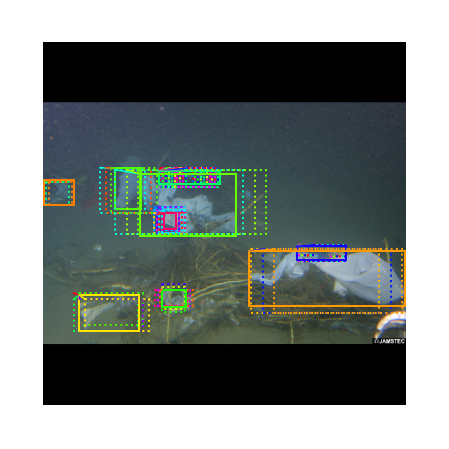

In [196]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

**PREDICCIONES**

In [197]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 65472, 2)         min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.70849  max:    1.58325  float32
refined_anchors          shape: (1, 6000, 4)          min: -248.60693  max:  250.46558  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (923,)                min:    0.00000  max: 5992.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


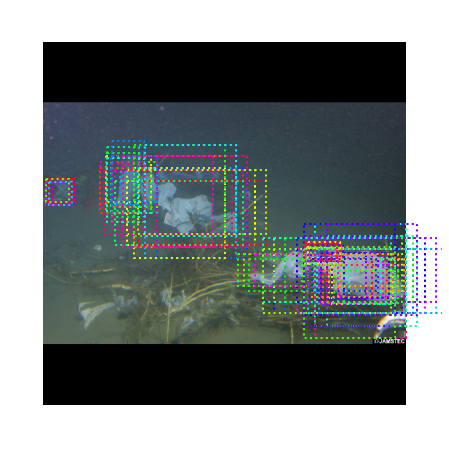

In [198]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

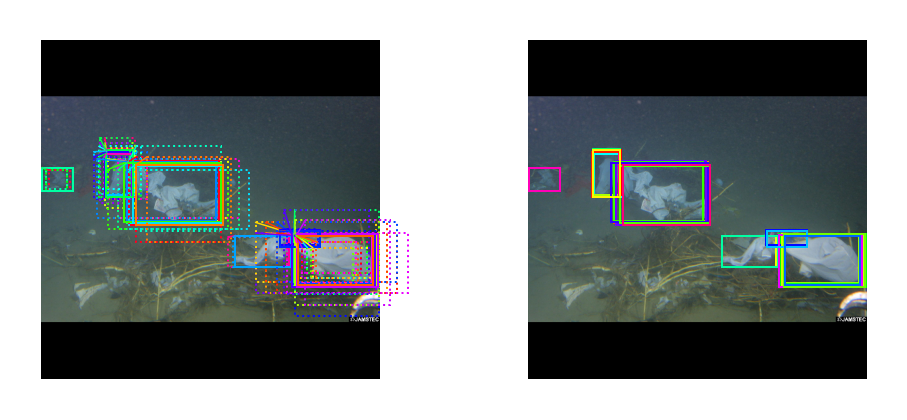

In [199]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

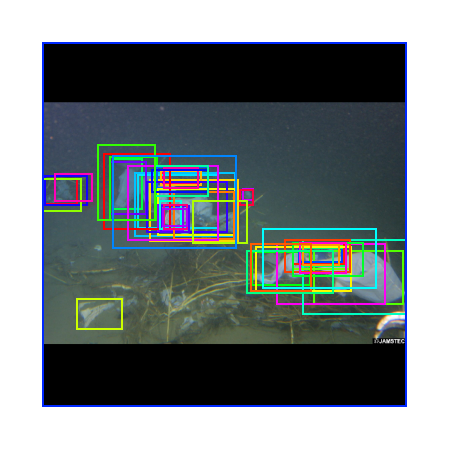

In [200]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [201]:
# Measure the RPN recall (percent of objects covered by anchors)
# Here we measure recall for 3 different methods:
# - All anchors
# - All refined anchors
# - Refined anchors after NMS
iou_threshold = 0.7

recall, positive_anchor_ids = utils.compute_recall(model.anchors, gt_bbox, iou_threshold)
print("All Anchors ({:5})       Recall: {:.3f}  Positive anchors: {}".format(
    model.anchors.shape[0], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(rpn['refined_anchors'][0], gt_bbox, iou_threshold)
print("Refined Anchors ({:5})   Recall: {:.3f}  Positive anchors: {}".format(
    rpn['refined_anchors'].shape[1], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(proposals, gt_bbox, iou_threshold)
print("Post NMS Anchors ({:5})  Recall: {:.3f}  Positive anchors: {}".format(
    proposals.shape[0], recall, len(positive_anchor_ids)))

All Anchors (65472)       Recall: 0.333  Positive anchors: 14
Refined Anchors ( 6000)   Recall: 0.000  Positive anchors: 0
Post NMS Anchors (   50)  Recall: 0.444  Positive anchors: 5


### Fase 2: Propuesta de Clasificación

In [202]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 20)         min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 20, 4)      min:   -7.94948  max:    8.64104  float32
masks                    shape: (1, 100, 28, 28, 20)  min:    0.00000  max:    1.00000  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    9.00000  float32


7 detections: ['Plastic_Bag' 'Plastic_Bag' 'Plastic_Bag' 'Plastic_Bag' 'Packaging_Bag'
 'Plastic_Bag' 'Plastic_Bag']


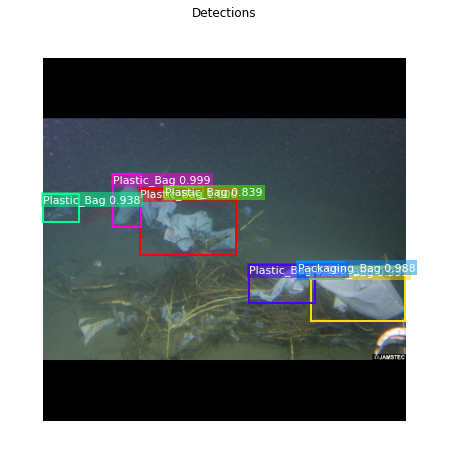

In [203]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset_test.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset_test.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

**DETECCIÓN PASO A PASO**

In [204]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset_test.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

923 Valid proposals out of 1000
50 Positive ROIs
[('BG', 950), ('Packaging_Bag', 8), ('Plastic_Bag', 42)]


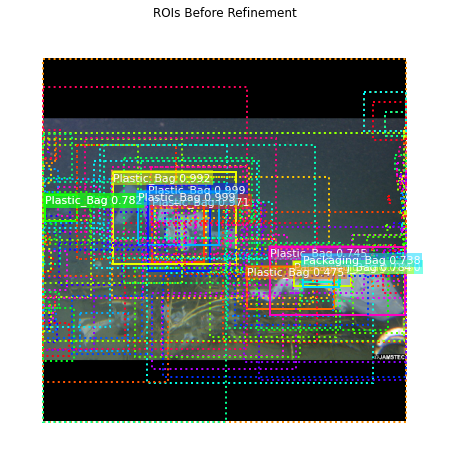

In [205]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset_test.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

roi_bbox_specific        shape: (1000, 4)             min:   -7.94948  max:    5.60633  float32
refined_proposals        shape: (1000, 4)             min:  -62.00000  max:  516.00000  int32


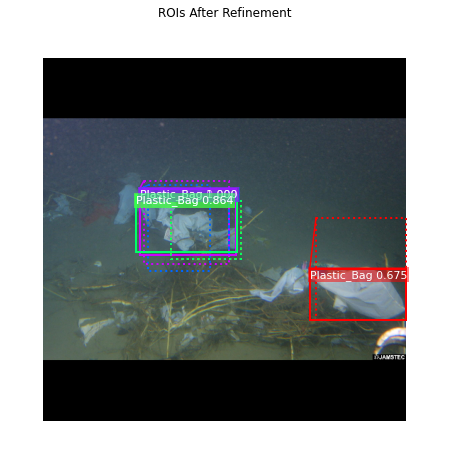

In [206]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset_test.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

In [207]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 50 detections:
[  0   1   2   3   4   5   6   7   8   9  10  11  13  14  15  16  17  19
  20  23  24  26  31  32  36  37  38  46  47  55  58  59  74  90  92  97
  99 117 168 170 176 181 214 216 249 284 352 450 507 580]


In [208]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.5 confidence. Keep 47:
[  0   1   2   3   4   5   6   7   8   9  10  11  13  14  15  16  19  20
  23  24  26  31  32  37  38  46  47  55  58  59  74  90  92  97 117 168
 170 176 181 214 216 249 284 352 450 507 580]


In [209]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset_test.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

Plastic_Bag           : [  0   1   2   3   4   6   7   8   9  10  11  14  19  20  24  26  32  37
  38  46  47  55  58  59  74  90  92 117 168 170 176 181 214 216 249 284
 352 450 507 580] -> [176   1  14  47  32   6]
Packaging_Bag         : [ 5 13 15 16 23 31 97] -> [5]

Kept after per-class NMS: 7
[  1   5   6  14  32  47 176]


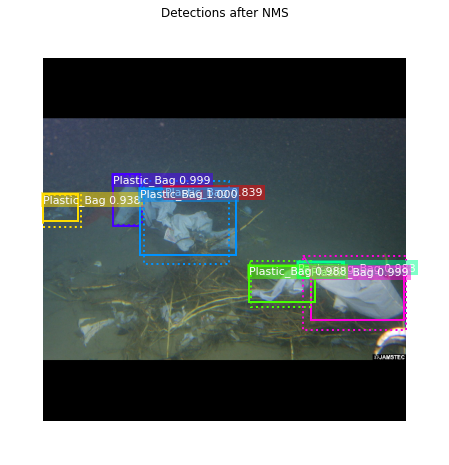

In [210]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset_test.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

### Fase 3: Generación de Máscaras


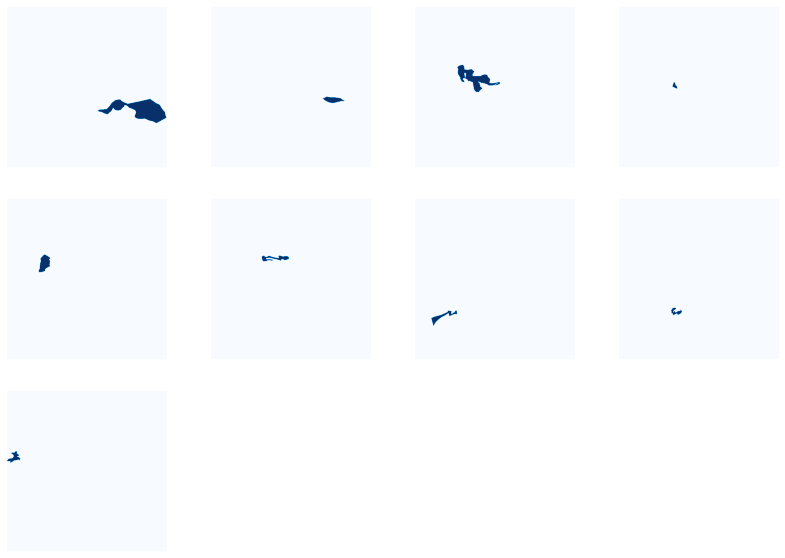

In [211]:
def display_images(images, titles=None, cols=4, cmap=None, norm=None,
                   interpolation=None):
    """Display the given set of images, optionally with titles.
    images: list or array of image tensors in HWC format.
    titles: optional. A list of titles to display with each image.
    cols: number of images per row
    cmap: Optional. Color map to use. For example, "Blues".
    norm: Optional. A Normalize instance to map values to colors.
    interpolation: Optional. Image interpolation to use for display.
    """
    titles = titles if titles is not None else [""] * len(images)
    rows = len(images) // cols + 1
    plt.figure(figsize=(14, 14 * rows // cols))
    i = 1
    for image, title in zip(images, titles):
        plt.subplot(rows, cols, i)
        plt.title(title, fontsize=9)
        plt.axis('off')
        plt.imshow(image.astype(np.uint8), cmap=cmap,
                   norm=norm, interpolation=interpolation)
        i += 1
    plt.show()


display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

In [212]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset_test.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    9.00000  float32
masks                    shape: (1, 100, 28, 28, 20)  min:    0.00000  max:    1.00000  float32
7 detections: ['Plastic_Bag' 'Plastic_Bag' 'Plastic_Bag' 'Plastic_Bag' 'Packaging_Bag'
 'Plastic_Bag' 'Plastic_Bag']


In [213]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (7, 28, 28)           min:    0.00000  max:    1.00000  float32
det_masks                shape: (7, 512, 512)         min:    0.00000  max:    1.00000  bool


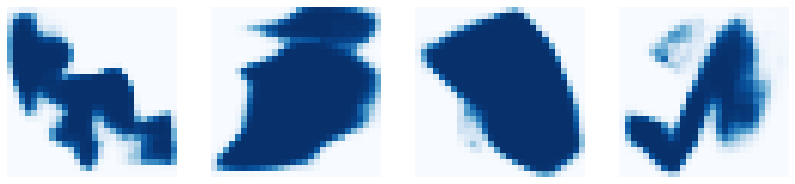

In [214]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

### Visualización de las Activaciones

In [215]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10001  float32
res4w_out                shape: (1, 32, 32, 1024)     min:    0.00000  max:   85.04644  float32
rpn_bbox                 shape: (1, 65472, 4)         min:  -17.86067  max:  172.67900  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


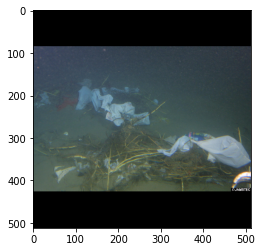

In [216]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

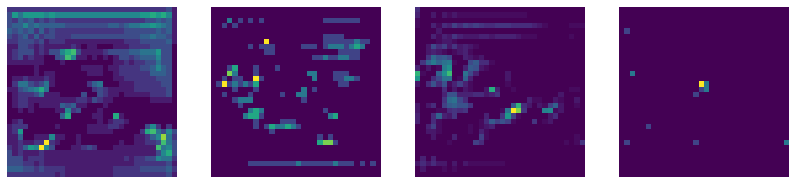

In [217]:
# Backbone feature map
def display_images(images, titles=None, cols=4, cmap=None, norm=None,
                   interpolation=None):
    """Display the given set of images, optionally with titles.
    images: list or array of image tensors in HWC format.
    titles: optional. A list of titles to display with each image.
    cols: number of images per row
    cmap: Optional. Color map to use. For example, "Blues".
    norm: Optional. A Normalize instance to map values to colors.
    interpolation: Optional. Image interpolation to use for display.
    """
    titles = titles if titles is not None else [""] * len(images)
    rows = len(images) // cols + 1
    plt.figure(figsize=(14, 14 * rows // cols))
    i = 1
    for image, title in zip(images, titles):
        plt.subplot(rows, cols, i)
        plt.title(title, fontsize=9)
        plt.axis('off')
        plt.imshow(image.astype(np.uint8), cmap=cmap,
                   norm=norm, interpolation=interpolation)
        i += 1
    plt.show()
display_images(np.transpose(activations["res4w_out"][0,:,:,:4], [2, 0, 1]))

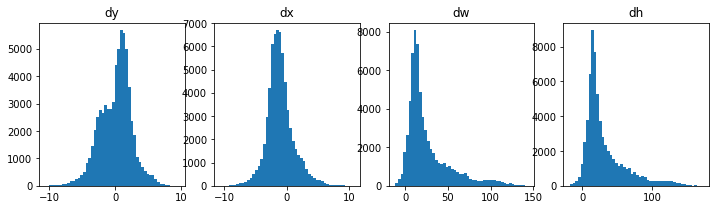

In [218]:
# Histograms of RPN bounding box deltas
plt.figure(figsize=(12, 3))
plt.subplot(1, 4, 1)
plt.title("dy")
_ = plt.hist(activations["rpn_bbox"][0,:,0], 50)
plt.subplot(1, 4, 2)
plt.title("dx")
_ = plt.hist(activations["rpn_bbox"][0,:,1], 50)
plt.subplot(1, 4, 3)
plt.title("dw")
_ = plt.hist(activations["rpn_bbox"][0,:,2], 50)
plt.subplot(1, 4, 4)
plt.title("dh")
_ = plt.hist(activations["rpn_bbox"][0,:,3], 50)

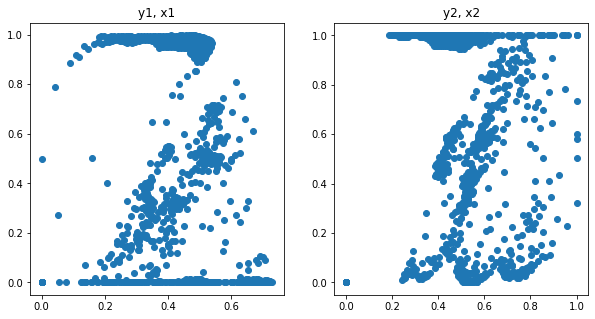

In [219]:
# Distribution of y, x coordinates of generated proposals
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("y1, x1")
plt.scatter(activations["roi"][0,:,0], activations["roi"][0,:,1])
plt.subplot(1, 2, 2)
plt.title("y2, x2")
plt.scatter(activations["roi"][0,:,2], activations["roi"][0,:,3])
plt.show()